# HOMEWORK 5

In this homework you are going to implement the **Floyd-Steinberg dithering** algorithm. Dithering, in general, means that we are adding noise to the signal (in our case digital image) in order to perceive it better. In other words, by adding the noise the objective quality will be worse but the subjective quality will be better (i.e. the image will "look" better).

The details of FS dithering can be found in this [wiki](https://en.wikipedia.org/wiki/Floyd%E2%80%93Steinberg_dithering) page. In order to implement the dithering, we will implement the following steps:
* Define colour pallette
* Quantize the image to obtain the baseline and compute the average quantization error
* Implement FS dithering and compute the average quantization error

You will also have to answer the question at the end of this notebook.

Note: In this homework, you will have the chance to earn some extra points. See the "Bonus" section at the end of the notebook. Good luck!

As always, you are encouraged to use your own images :-)

In [34]:
import cv2
import math
import numpy as np
from matplotlib import pyplot as plt
plt.rcParams['figure.figsize'] = [15, 10]

Let's load the image.

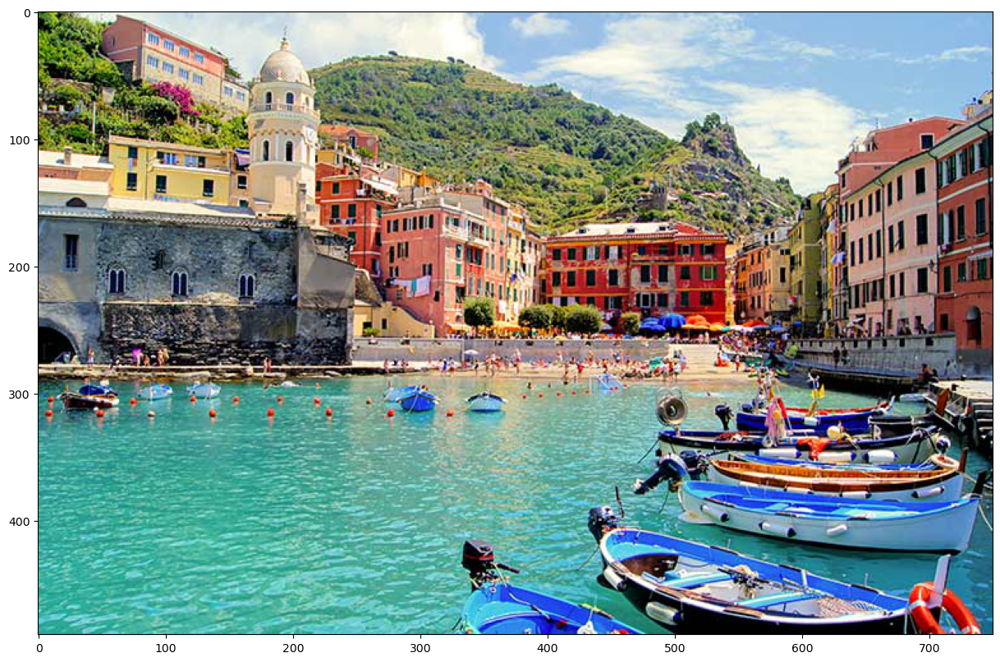

In [35]:
# Load image
img = cv2.imread('5-things-italy.jpg')
# Convert it to RGB
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
# Plot it
plt.imshow(img)

Let's start with gray tones first.

In [36]:
# Black, dark gray, light gray, white
colors = np.array([[0, 0, 0],
                   [64, 64, 64],
                   [192, 192, 192],
                   [255, 255, 255]])

Using the colour pallette, let's quantize the original image.

In [37]:
# Cast the image to float
img = img.astype(float)

# Prepare for quantization
rows, cols, channels = img.shape
quantized = np.zeros_like(img)

# Apply quantization
for r in range(rows):
    for c in range(cols):
        # Extract the original pixel value
        pixel = img[r, c, :]
        
        # Find the closest colour from the pallette (using absolute value/Euclidean distance)
        # Note: You may need more than one line of code here
        distances = np.linalg.norm(colors - pixel, axis=1)
        new_pixel = colors[np.argmin(distances)]
        
        # Apply quantization
        quantized[r, c, :] = new_pixel

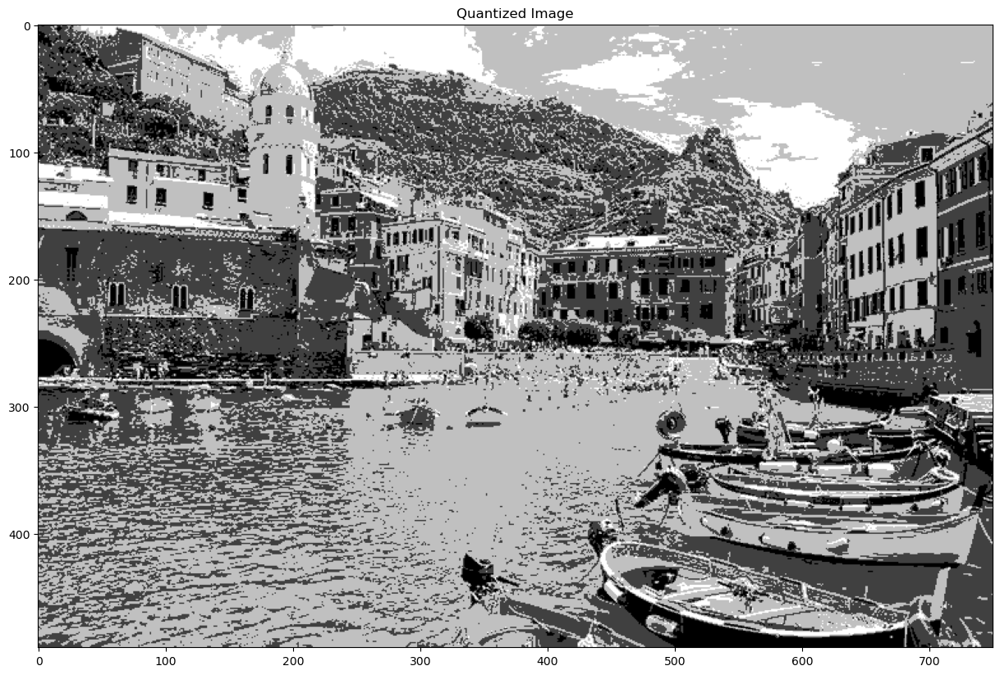

In [38]:
# Show quantized image (don't forget to cast back to uint8)
plt.imshow(quantized.astype(np.uint8))
plt.title('Quantized Image')
plt.show()

In [39]:
# Compute average quantization error
avg_quant_error = np.mean(np.abs(img - quantized))
print (avg_quant_error)

36.726622222222225


#### Floyd-Steinberg Dithering
We are now going to implement the FS dithering and compare it to the optimally quantized image we have calculated above.

In [40]:
# Make a temporal copy of the original image, we will need it for error diffusion
img_tmp = np.copy(img)
dithering = np.zeros_like(img)

for r in range(1, rows-1):
    for c in range(1, cols-1):
        # Extract the original pixel value
        pixel = img_tmp[r, c, :]
        # Find the closest colour from the pallette (using absolute value/Euclidean distance)
        # Note: You may need more than one line of code here
        distances = np.linalg.norm(colors - pixel, axis=1)
        new_pixel = colors[np.argmin(distances)]        
        
        # Compute quantization error
        quant_error = pixel - new_pixel
        
        # Diffuse the quantization error accroding to the FS diffusion matrix
        # Note: You may need more than one line of code here
        img_tmp[r, c, :] = new_pixel
        img_tmp[r, c + 1, :] += quant_error * 7 / 16
        img_tmp[r + 1, c - 1, :] += quant_error * 3 / 16
        img_tmp[r + 1, c, :] += quant_error * 5 / 16
        img_tmp[r + 1, c + 1, :] += quant_error * 1 / 16
        
        # Apply dithering
        dithering[r, c, :] = new_pixel

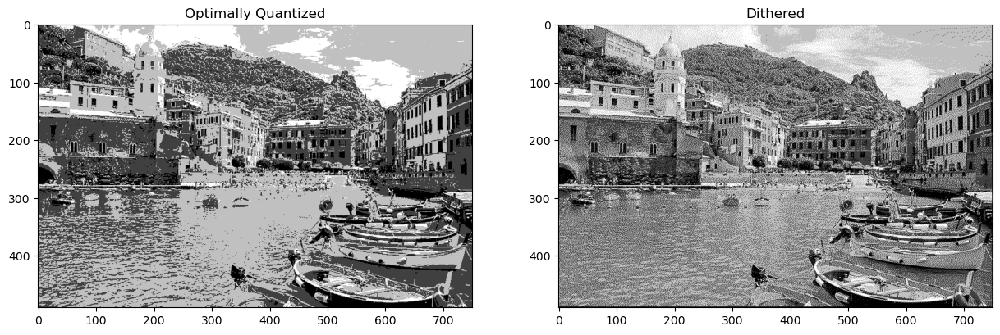

In [41]:
# Show quantized image (don't forget to cast back to uint8)
plt.subplot(121)
plt.imshow(quantized.astype(np.uint8))
plt.title('Optimally Quantized')

plt.subplot(122)
plt.imshow(dithering.astype(np.uint8))
plt.title('Dithered')
plt.show()

In [42]:
# Compute average quantization error for dithered image
avg_dith_error = np.mean(np.abs(img - dithering))
print(avg_dith_error)

43.12287891156463


### Questions
* Which image has higher quantization error? Optimally quantized or dithered?
  Dithered (43.12 vs 36.73 of quantized)
* Which image looks better to you?
  Dithered, since its closer to the original (in terms of perception)
* Can you repeat the same process using only two colours: black and white? Show me :-)
  See below

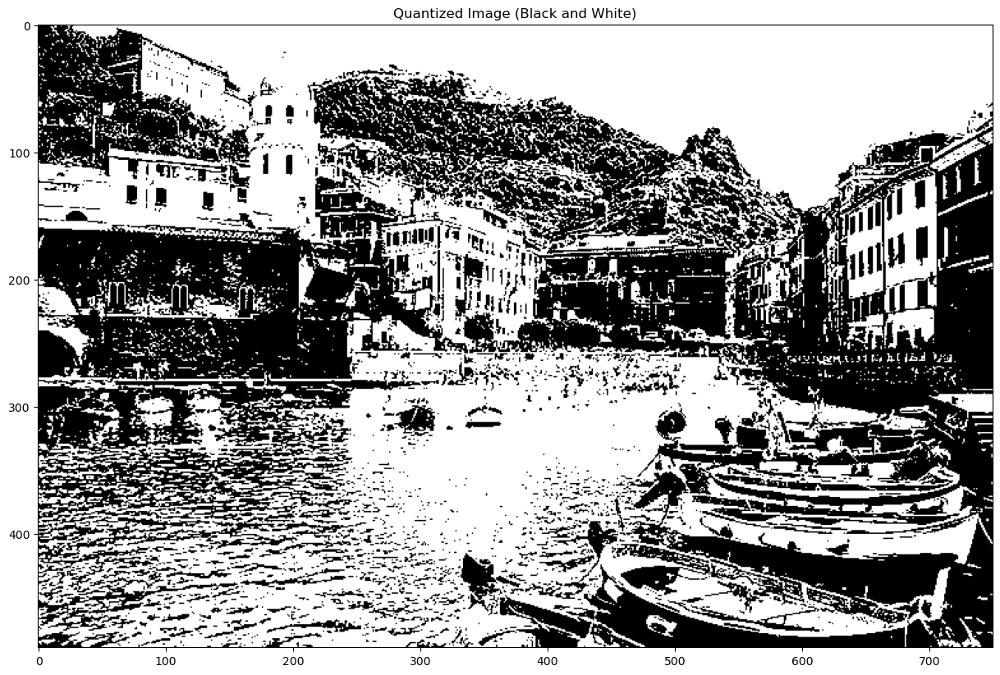

Average quantization error (Black and White): 80.1449052154195


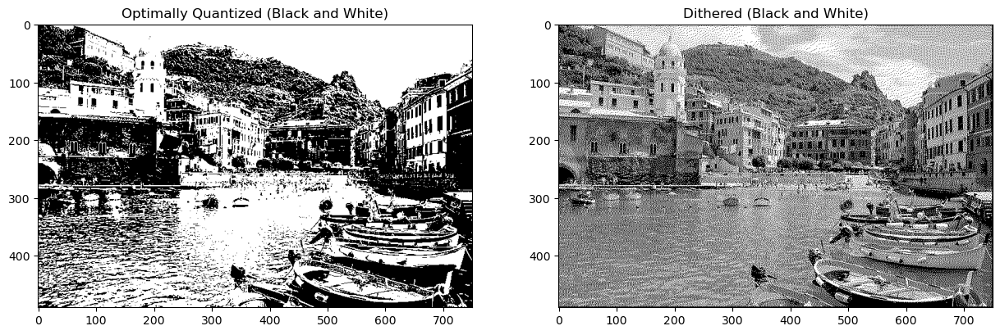

Average dithered quantization error (Black and White): 97.67653333333334


In [43]:
# Black, white
colors_bw = np.array([[0, 0, 0], [255, 255, 255]])

# Prepare for quantization
quantized_bw = np.zeros_like(img)

# Apply quantization
for r in range(rows):
    for c in range(cols):
        pixel = img[r, c, :]
        distances = np.linalg.norm(colors_bw - pixel, axis=1)
        new_pixel = colors_bw[np.argmin(distances)]
        quantized_bw[r, c, :] = new_pixel

plt.imshow(quantized_bw.astype(np.uint8), cmap='gray')
plt.title('Quantized Image (Black and White)')
plt.show()

# Compute average quantization error for BW
avg_quant_error_bw = np.mean(np.abs(img - quantized_bw))

print(f'Average quantization error (Black and White): {avg_quant_error_bw}')

# Floyd-Steinberg Dithering for BW
img_tmp_bw = np.copy(img)
dithering_bw = np.zeros_like(img)

for r in range(rows - 1):
    for c in range(1, cols - 1):
        pixel = img_tmp_bw[r, c, :]
        distances = np.linalg.norm(colors_bw - pixel, axis=1)
        new_pixel = colors_bw[np.argmin(distances)]
        quant_error = pixel - new_pixel
        img_tmp_bw[r, c, :] = new_pixel
        img_tmp_bw[r, c + 1, :] += quant_error * 7 / 16
        img_tmp_bw[r + 1, c - 1, :] += quant_error * 3 / 16
        img_tmp_bw[r + 1, c, :] += quant_error * 5 / 16
        img_tmp_bw[r + 1, c + 1, :] += quant_error * 1 / 16
        dithering_bw[r, c, :] = new_pixel

plt.subplot(121)
plt.imshow(quantized_bw.astype(np.uint8), cmap='gray')
plt.title('Optimally Quantized (Black and White)')

plt.subplot(122)
plt.imshow(dithering_bw.astype(np.uint8), cmap='gray')
plt.title('Dithered (Black and White)')
plt.show()

# Compute average quantization error for dithered BW image
avg_dith_error_bw = np.mean(np.abs(img - dithering_bw))

print(f'Average dithered quantization error (Black and White): {avg_dith_error_bw}')


### Questions
* Which image has higher quantization error? Optimally quantized or dithered?
* Which image looks better to you?
* Can you repeat the same process using only two colours: black and white? Show me :-)

### Bonus Points

Repeat the homework using a diffrerent image pallette. For instance, you can use an optimal colour
pallette that we can calculate via k-means algorithm. The following snippet of code will give you the 16
optimal colours for your original image.

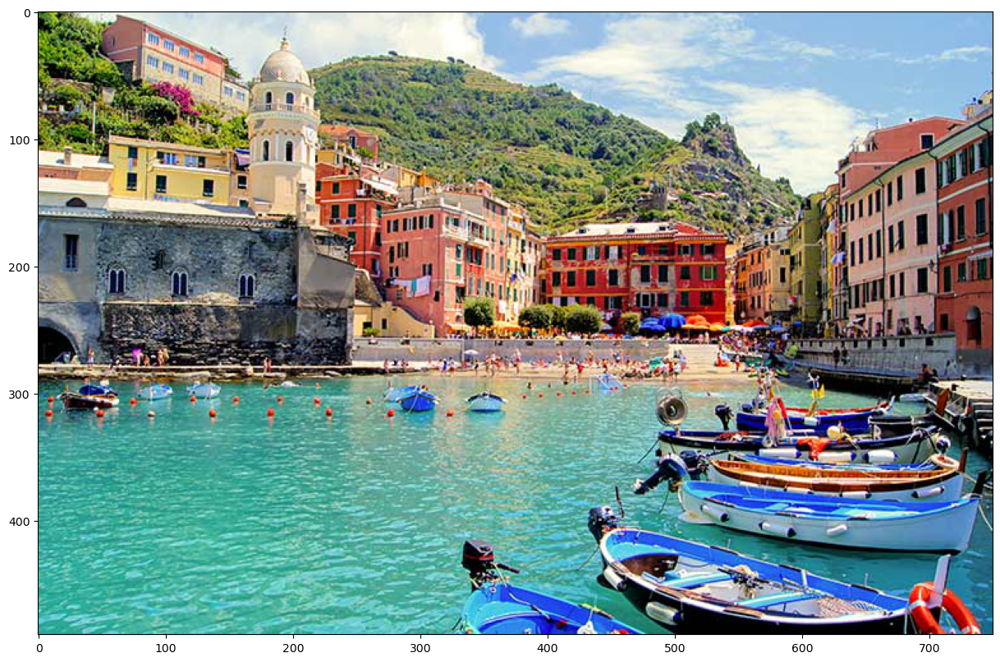

In [44]:
import cv2
import math
import numpy as np
from matplotlib import pyplot as plt
plt.rcParams['figure.figsize'] = [15, 10]

# Load image
img = cv2.imread('5-things-italy.jpg')
# Convert it to RGB
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
# Plot it
plt.imshow(img)

In [51]:
# Cast the image to float
img_float = img.astype(float)

from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=16).fit(np.reshape(img_float, (-1, 3)))
colors = kmeans.cluster_centers_

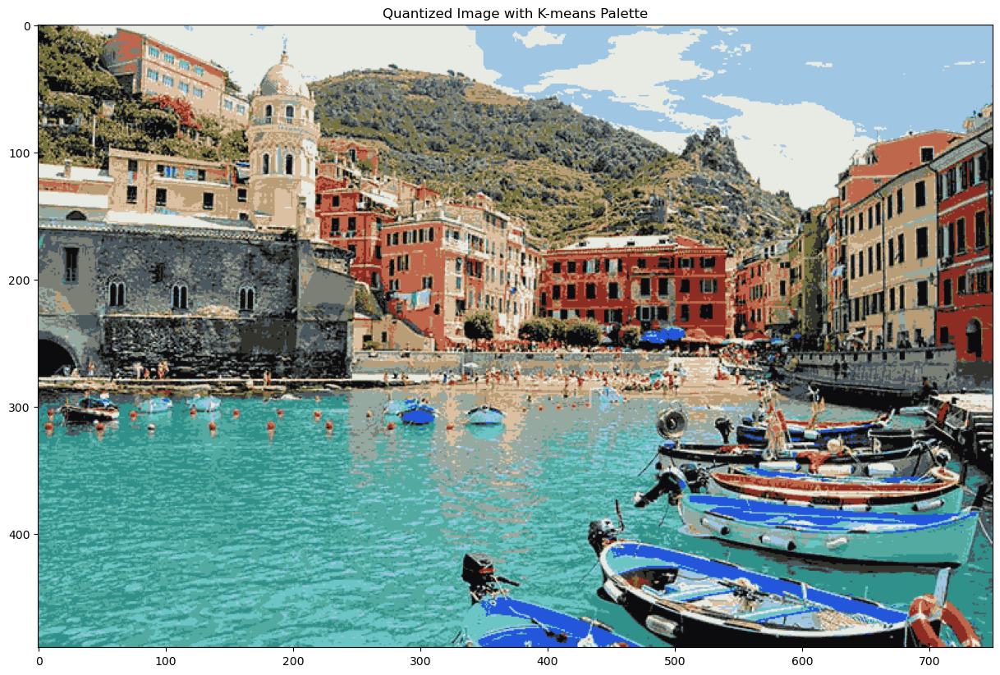

Average quantization error with K-means palette: 13.591116864053019


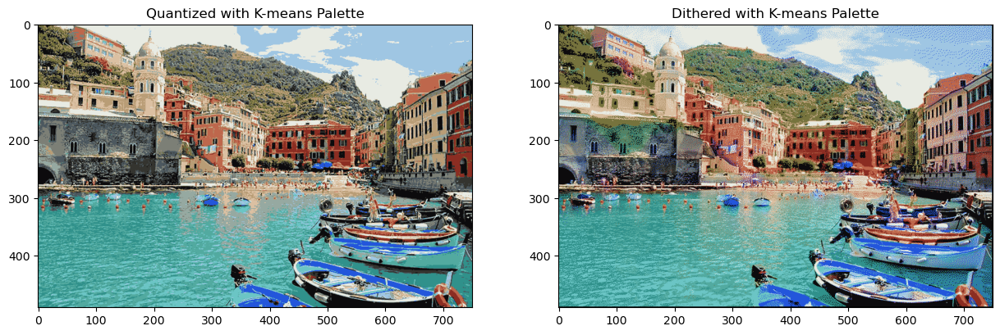

Average dithered quantization error with K-means palette: 21.012888251442025


In [52]:
# Prepare for quantization
rows, cols, channels = img.shape
quantized_kmeans = np.zeros_like(img_float)

# Apply quantization
for r in range(rows):
    for c in range(cols):
        pixel = img_float[r, c, :]
        distances = np.linalg.norm(colors - pixel, axis=1)
        new_pixel = colors[np.argmin(distances)]
        quantized_kmeans[r, c, :] = new_pixel

plt.imshow(quantized_kmeans.astype(np.uint8))
plt.title('Quantized Image with K-means Palette')
plt.show()

# Compute average quantization error
avg_quant_error_kmeans = np.mean(np.abs(img_float - quantized_kmeans))
print(f'Average quantization error with K-means palette: {avg_quant_error_kmeans}')

# Floyd-Steinberg Dithering
img_tmp_kmeans = np.copy(img_float)
dithering_kmeans = np.zeros_like(img_float)

for r in range(rows - 1):
    for c in range(1, cols - 1):
        pixel = img_tmp_kmeans[r, c, :]
        distances = np.linalg.norm(colors - pixel, axis=1)
        new_pixel = colors[np.argmin(distances)]
        quant_error = pixel - new_pixel
        img_tmp_kmeans[r, c, :] = new_pixel
        img_tmp_kmeans[r, c + 1, :] += quant_error * 7 / 16
        img_tmp_kmeans[r + 1, c - 1, :] += quant_error * 3 / 16
        img_tmp_kmeans[r + 1, c, :] += quant_error * 5 / 16
        img_tmp_kmeans[r + 1, c + 1, :] += quant_error * 1 / 16
        dithering_kmeans[r, c, :] = new_pixel

# Show quantized and dithered images (don't forget to cast back to uint8)
plt.subplot(121)
plt.imshow(quantized_kmeans.astype(np.uint8))
plt.title('Quantized with K-means Palette')

plt.subplot(122)
plt.imshow(dithering_kmeans.astype(np.uint8))
plt.title('Dithered with K-means Palette')
plt.show()

# Compute average quantization error for dithered image
avg_dith_error_kmeans = np.mean(np.abs(img_float - dithering_kmeans))
print(f'Average dithered quantization error with K-means palette: {avg_dith_error_kmeans}')

Apply FS dithering the same way you did before.
* How does the result look like to you?
  Now it has color, since we use basically took colors from the original image and used them for quantization
* What happens if we use 32 colours?
  It seems like it is closer to the original image
* And what happens if we use 256 colours?
  Seems like even closer to the original
  